In [65]:
import yfinance as yf
import numpy as np
import itertools
from datetime import datetime
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.style.use('ggplot')

date_format = "%Y-%m-%d"
startDate = '2010-1-1'
endDate = '2020-6-10'

# position info
POSITION = [
    'rds-b','xom','psx','cvx','oxy'
]

In [60]:
infoNeeded = {}
for tickerSymbol in POSITION:
    tickerData = yf.Ticker(tickerSymbol)
    closeSeries = tickerData.history(period='1d', start=startDate, end=endDate)['Close']
    infoNeeded[tickerSymbol] = [tickerData, closeSeries]
dict.keys(infoNeeded)
pairs = list(itertools.combinations(dict.keys(infoNeeded), 2))

Compare Set: rds-b vs rds-a


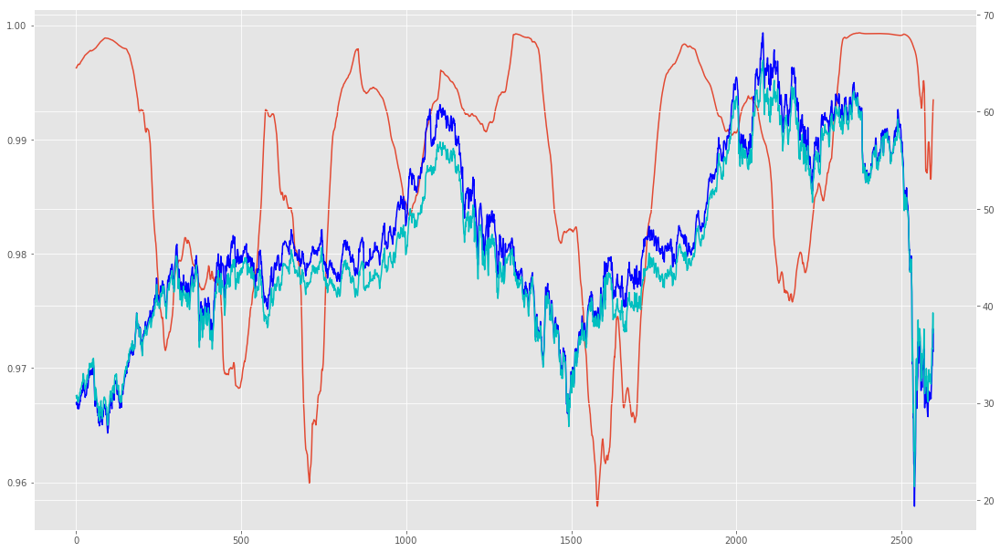

Compare Set: rds-b vs xom


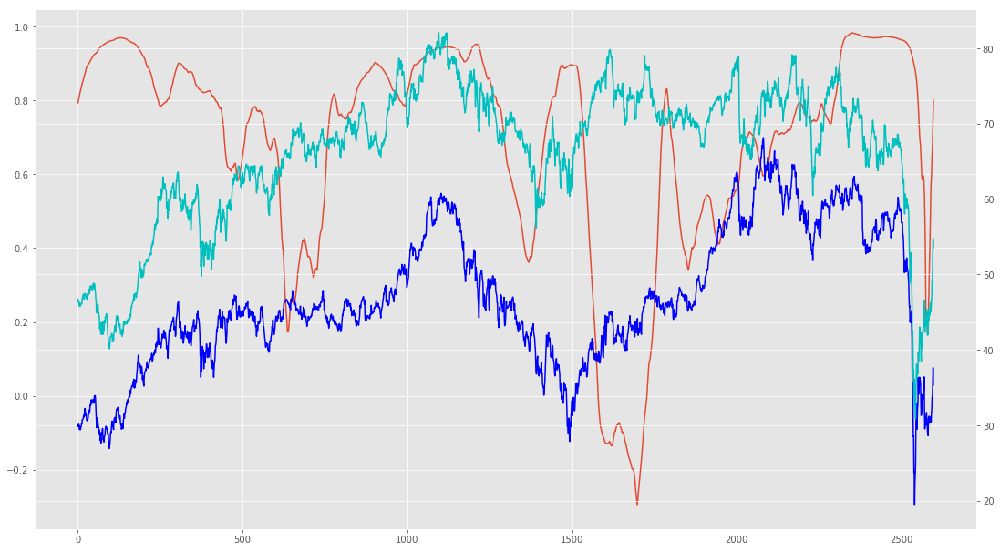

Compare Set: rds-b vs psx


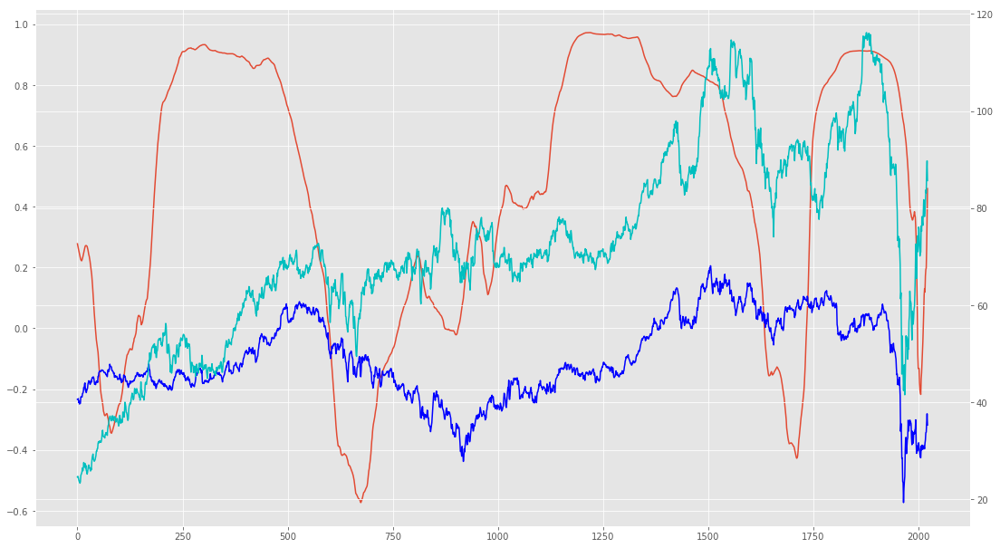

Compare Set: rds-b vs cvx


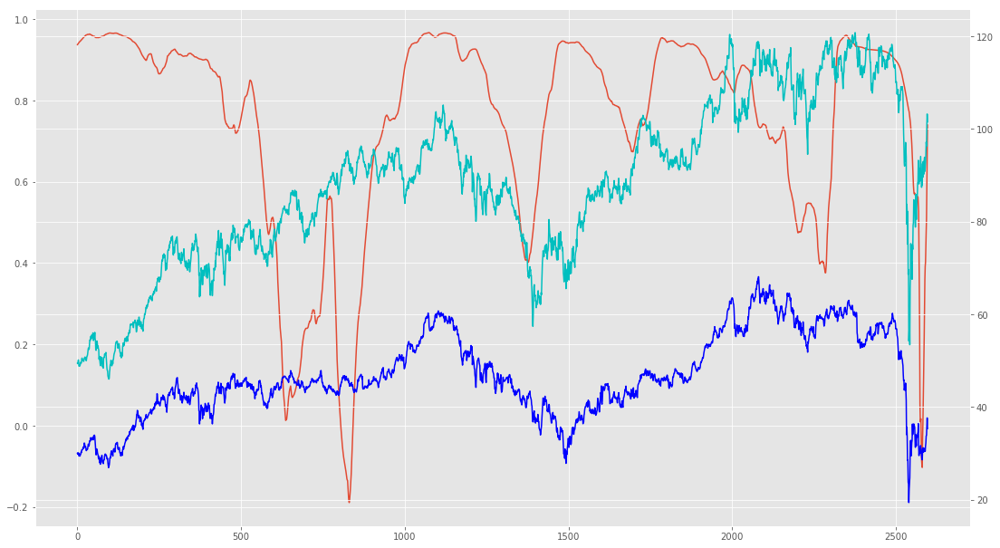

Compare Set: rds-b vs oxy


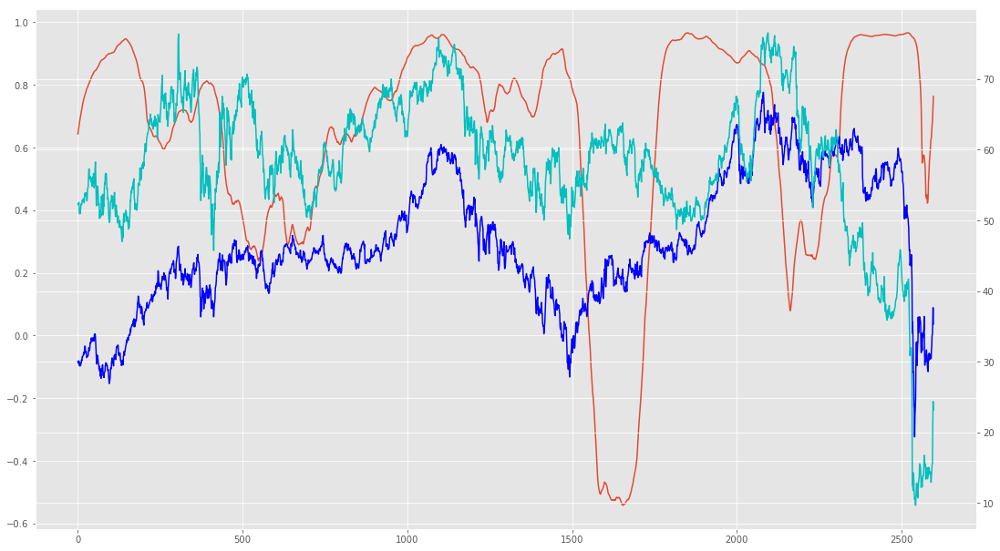

Compare Set: rds-a vs xom


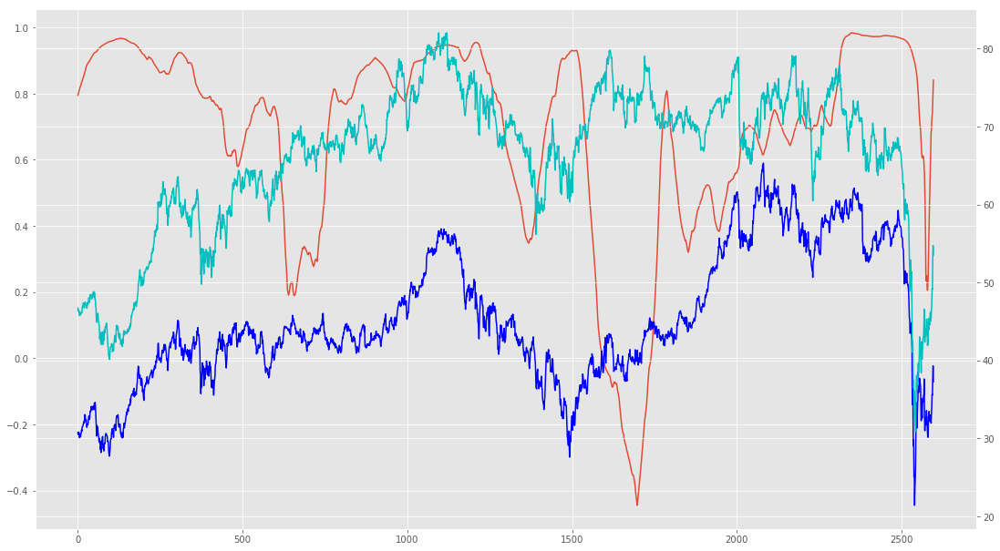

Compare Set: rds-a vs psx


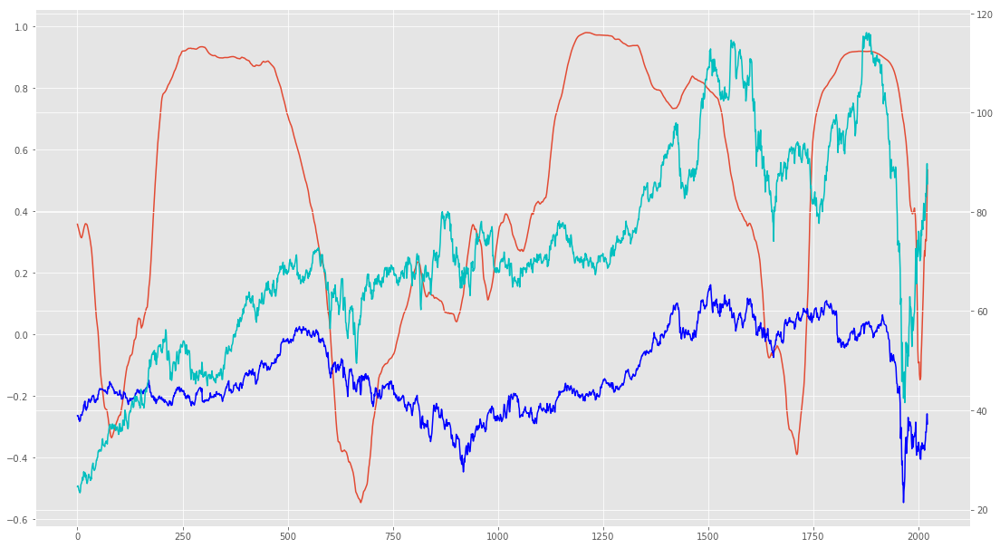

Compare Set: rds-a vs cvx


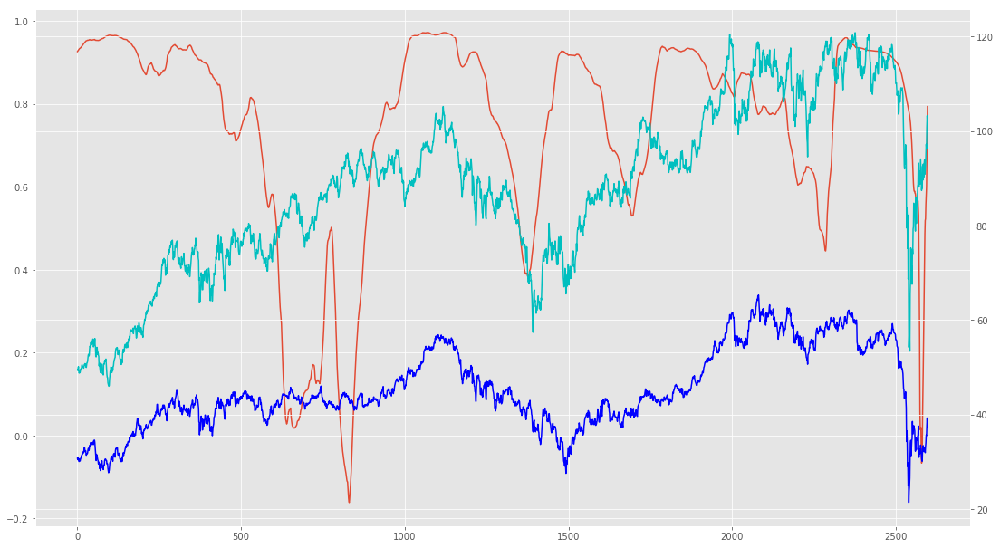

Compare Set: rds-a vs oxy


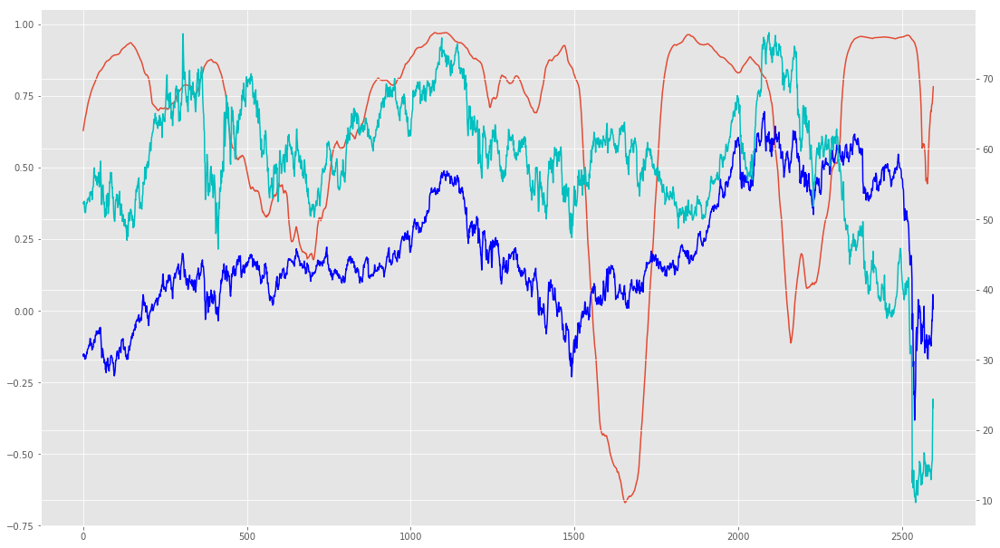

Compare Set: xom vs psx


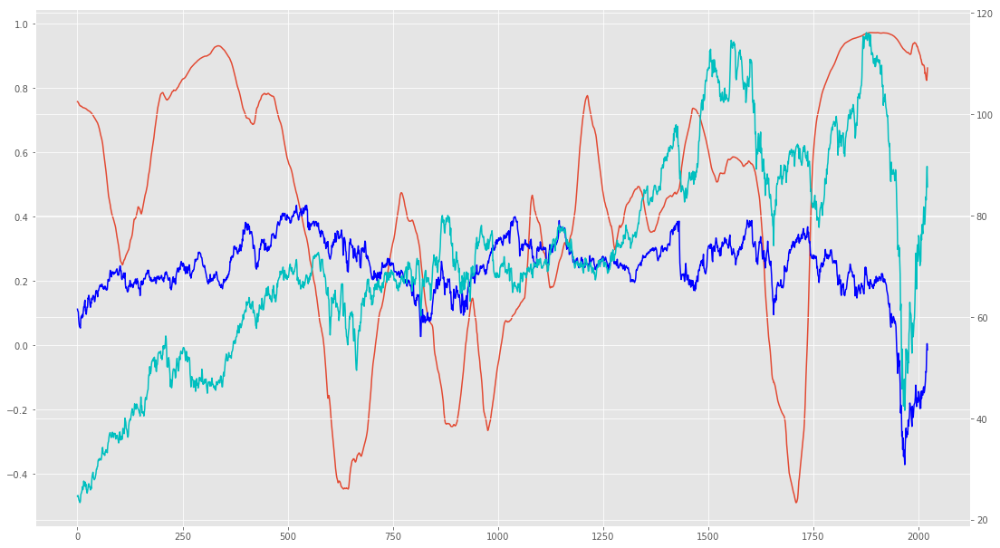

Compare Set: xom vs cvx


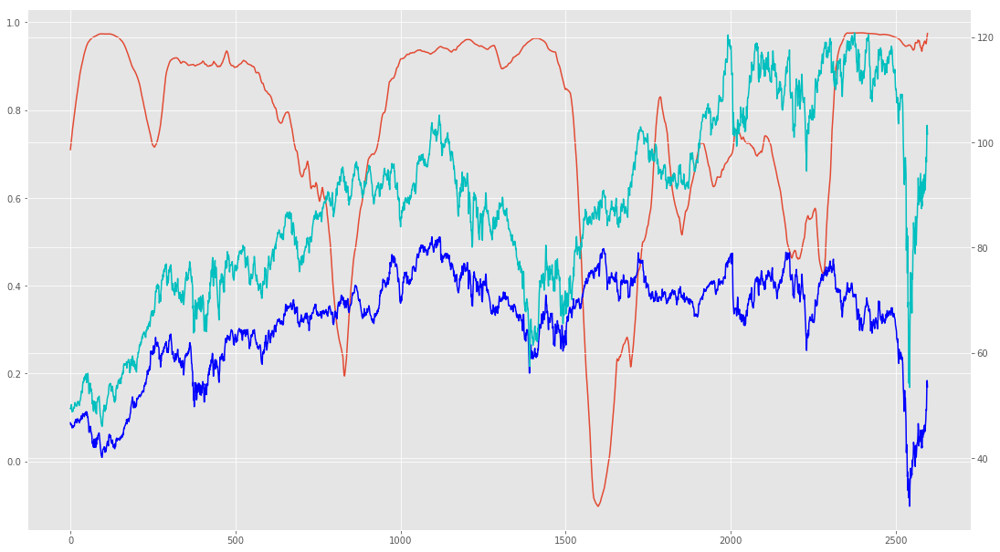

Compare Set: xom vs oxy


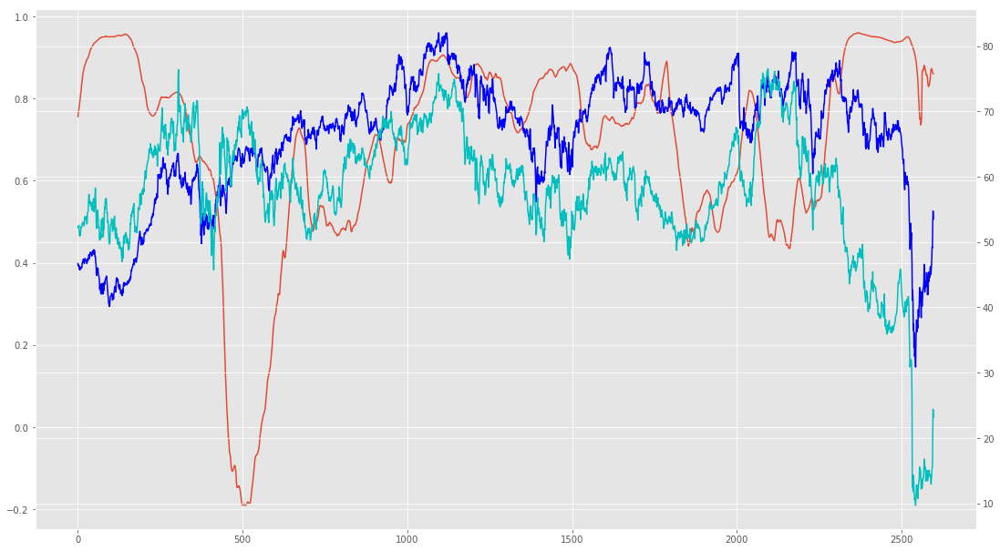

Compare Set: psx vs cvx


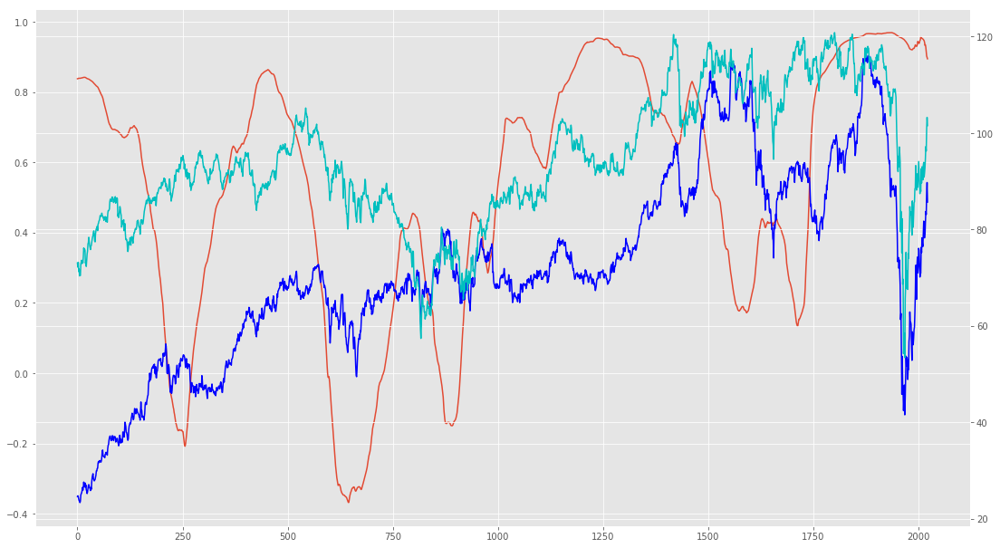

Compare Set: psx vs oxy


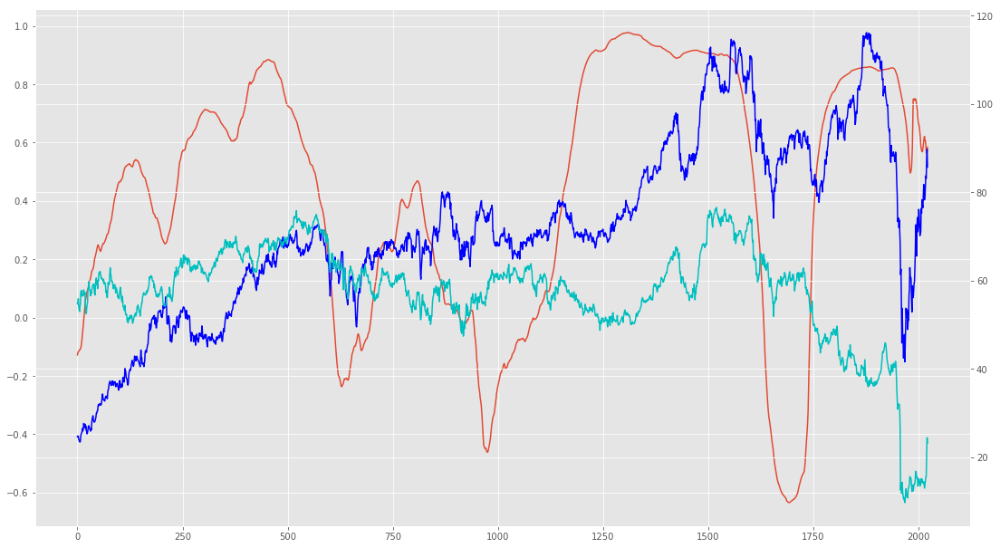

Compare Set: cvx vs oxy


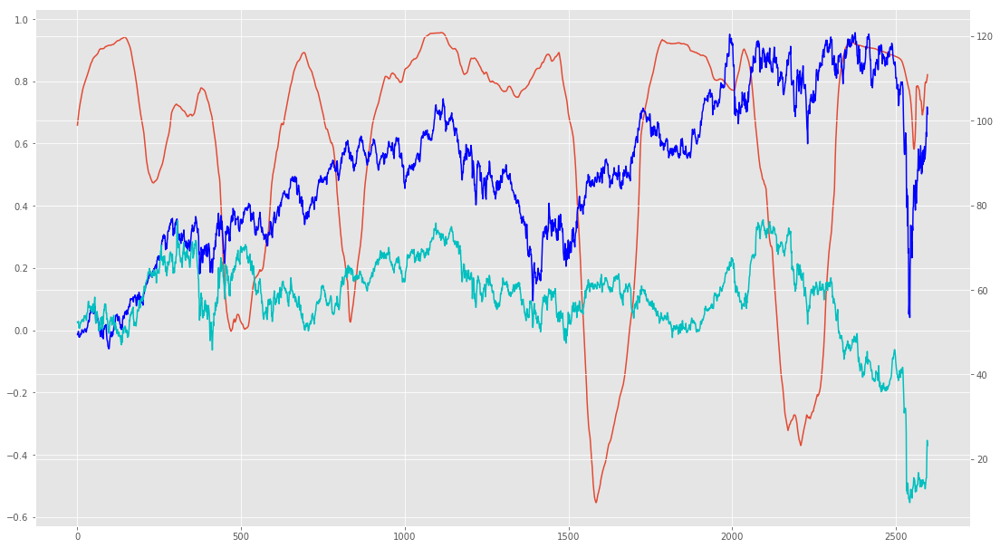

In [90]:
delta = datetime.strptime(endDate, date_format) - datetime.strptime(startDate, date_format)
corrSpan = 250
dict.keys(infoNeeded)
pairs = list(itertools.combinations(dict.keys(infoNeeded), 2))
for pair in pairs:   
    print("Compare Set: " + pair[0] + ' vs ' + pair[1])
    corrLst = []
    lstA = infoNeeded[pair[0]][1]
    lstB = infoNeeded[pair[1]][1]
    minLength = min(len(lstA), len(lstB))
    lstA = lstA[-minLength:]
    lstB = lstB[-minLength:]
    loopTime = minLength//corrSpan + 1
    try:
        for i in range(minLength-30):
            corr = np.corrcoef(lstA[i:i+corrSpan], lstB[i:i+corrSpan])[0][1]
            corrLst.append(corr)
    except:
        print("Fail")
        pass
    fig, ax1 = plt.subplots()
    ax1.plot(corrLst)
    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    ax2.plot(lstA[30:].tolist(), color='b')
    ax2.plot(lstB[30:].tolist(), color='c')
    fig.set_size_inches(18.5, 10.5)
    plt.show()

Compare Set: rds-b vs rds-a


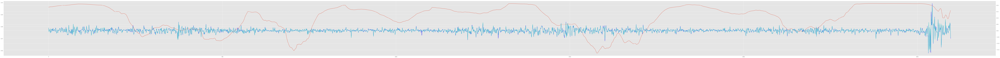

Compare Set: rds-b vs xom


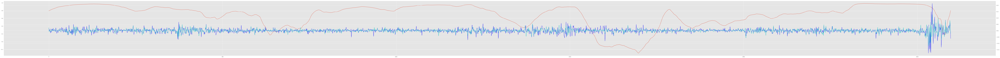

Compare Set: rds-b vs psx


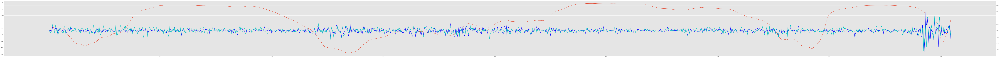

Compare Set: rds-b vs cvx


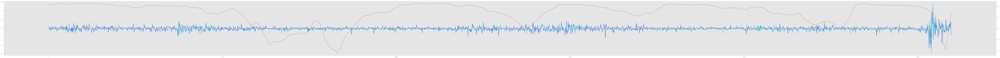

Compare Set: rds-b vs oxy


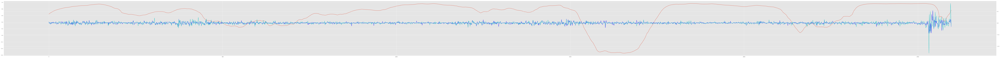

Compare Set: rds-a vs xom


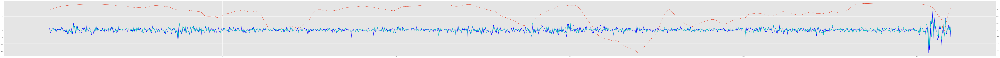

Compare Set: rds-a vs psx


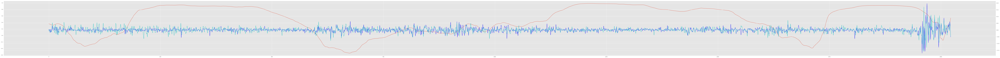

Compare Set: rds-a vs cvx


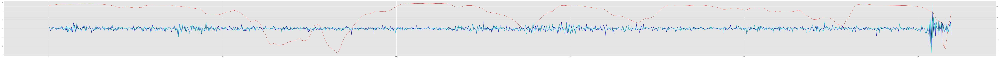

Compare Set: rds-a vs oxy


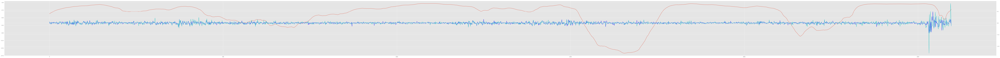

Compare Set: xom vs psx


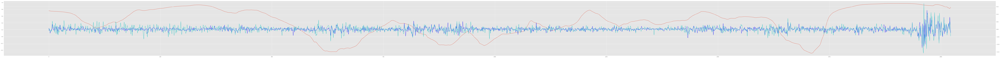

Compare Set: xom vs cvx


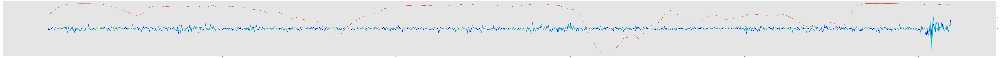

Compare Set: xom vs oxy


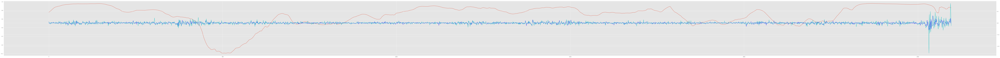

Compare Set: psx vs cvx


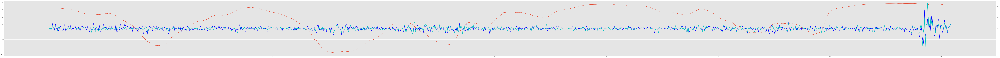

Compare Set: psx vs oxy


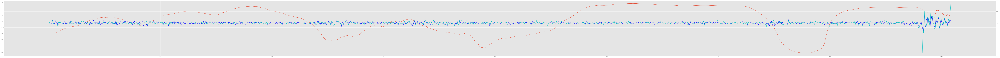

Compare Set: cvx vs oxy


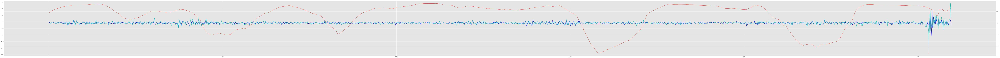

In [92]:
delta = datetime.strptime(endDate, date_format) - datetime.strptime(startDate, date_format)
corrSpan = 250
dict.keys(infoNeeded)
pairs = list(itertools.combinations(dict.keys(infoNeeded), 2))
for pair in pairs:   
    print("Compare Set: " + pair[0] + ' vs ' + pair[1])
    corrLst = []; priceA = []; priceB = []
    lstA = infoNeeded[pair[0]][1]
    lstB = infoNeeded[pair[1]][1]
    minLength = min(len(lstA), len(lstB))
    lstA = lstA[-minLength:]
    lstB = lstB[-minLength:]
    loopTime = minLength//corrSpan + 1
    try:
        for i in range(minLength-30):
            corr = np.corrcoef(lstA[i:i+corrSpan], lstB[i:i+corrSpan])[0][1]
            priceA.append((lstA[i+30]  - lstA[i+29])/lstA[i+29])
            priceB.append((lstB[i+30]  - lstB[i+29])/lstB[i+29])
            corrLst.append(corr)
    except:
        print("Fail")
        pass
    fig, ax1 = plt.subplots()
    ax1.plot(corrLst)
    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    ax2.plot(priceA, color='b')
    ax2.plot(priceB, color='c')
    fig.set_size_inches(185, 10.5)
    plt.show()